# Exploratory data analysis (EDA)

L'analyse exploratoire des données __des émissions de CO2e__ par __les véhicules électriques et thermiques__ représente une étape fondamentale dans la compréhension et la comparaison des impacts environnementaux de ces deux types de véhicules. Cette analyse __vise à examiner__ et __à interpréter__ les données disponibles sur les émissions de dioxyde de carbone équivalent (CO2e) émanant de ces deux catégories de véhicules, __en mettant en lumière leurs différences, leurs similarités et leur contribution__ respective à l'empreinte carbone globale.

En considérant un large éventail de paramètres et de variables, cette étude exploratoire __cherche à apporter des éclairages__ sur plusieurs aspects, notamment __la variabilité des émissions__ en fonction des modèles de véhicules électriques et thermiques,  __les sources d'énergie__ employées pour alimenter ces véhicules, ainsi que __les tendances d'émissions au fil du temps__.

![](https://www.strategie.gouv.fr/sites/strategie.gouv.fr/files/thumbnails/image/comment_faire_enfin_baisser_les_emissions_de_co2_des_voitures_-_header.jpg)

## Plan:

**ÉTAPE 1 : Connexion à la base de données** <br>
**ÉTAPE 2 : Analyse exploratoire** <br>
**ÉTAPE 3 : Visualisation des données**  <br>
**ÉTAPE 4 : Analyse exploratoire des données nettoyées** <br>



In [0]:
import requests
import psycopg2
import base64
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import matplotlib.style as style
from scipy.stats import skew
from scipy import stats
import matplotlib.gridspec as gridspec
import plotly
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go


from sklearn.preprocessing import LabelEncoder

# Color Palette

custom_colors = ["#A67BC5","#BB1C8B","#05A4C0",'#CCEBC5',"#D2A7D8",'#FDDAEC',  "#85CEDA",]
customPalette = sns.set_palette(sns.color_palette(custom_colors))

# Set size

sns.palplot(sns.color_palette(custom_colors),size=1)
plt.tick_params(axis='both', labelsize=0, length = 0)

## 🔗 ÉTAPE 1 : Connexion à la base de données

In [0]:
# Obtenir l'adresse IP publique de la machine
def get_public_ip():
    try:
        # Effectuer une requête HTTP à un service externe qui renvoie l'adresse IP publique
        response = requests.get('https://api.ipify.org/?format=json', timeout=10)
        public_ip = response.json()['ip']
        return public_ip
    except requests.RequestException:
        return "Impossible de récupérer l'adresse IP publique"

# Appeler la fonction pour obtenir l'adresse IP publique
ip_address = get_public_ip()
print("Adresse IP publique :", ip_address)

Adresse IP publique : 35.86.113.54


In [0]:
PG_HOST = 'rncp-ol.postgres.database.azure.com'
PG_PORT = 5432
PG_DATABASE = 'rncp_prod'
PG_USERNAME = 'm2i'
PG_PASSWORD = 'Uk5DUF9vbDIwMjM='
PG_CONNECT_TIMEOUT = 10

# Établir la connexion à la base de données PostgreSQL
pg_conn = psycopg2.connect(
    host=PG_HOST,
    port=PG_PORT,
    database=PG_DATABASE,
    user=PG_USERNAME,
    password=base64.b64decode(PG_PASSWORD).decode('utf-8'),
    connect_timeout=PG_CONNECT_TIMEOUT
)
# Créer un curseur
pg_cursor = pg_conn.cursor()

# Exécuter la requête SQL
pg_cursor.execute("SELECT * FROM co2_vehicles_new_clean")

# Récupérer la résultat retournée par la requête
results = pg_cursor.fetchall()

# Convertir les résultats en DataFrame
co2_vehicles_df = pd.DataFrame(results, columns=[desc[0] for desc in pg_cursor.description])


# Fermer le curseur et la connexion à la base de données
pg_cursor.close()




## 🔍  ÉTAPE 2 : Analyse exploratoire


<p>Nous allons suivre les étapes suivantes :<b> <ul>
    <li>Manipulation de données 
    <li>Analyses exploratoires & Visualisations 
    <li>Analyses descriptives </ul>



## 🔧 <span style="color:blue">**Manipulation de données**</span>


C'est toujours une bonne approche de vérifier les attributs des données, comme leur forme ou le nombre de lignes et de colonnes dans l'ensemble de données. Pour vérifier la forme des données, exécutez les codes suivants:

In [0]:
# Affichage du DataFrame
co2_vehicles_df.display()

uid,id,country,vfn,tan,make,cn,category,mro,co2e,length,width,ft,ec,z,year
1,3816940,AT,,,VOLKSWAGEN,UP!,M1,1229.0,0.0,2417.0,1412.0,Electric,null,117.0,2019
2,89,AT,,10558/2014,THINK,TH!NK CITY,M1,1190.0,null,1971.0,1386.0,Electric,null,190.0,2014
6,52,AT,,17530/2015,KIA,SOULEV,M1,1565.0,null,2570.0,1576.0,Electric,null,147.0,2015
45,8281,AT,,E1*2007/46*1213*03,BMW,I3,M1,1270.0,null,2570.0,1571.0,Electric,null,129.0,2015
46,8282,AT,,E1*2007/46*1213*04,BMW,I3,M1,1270.0,null,2570.0,1571.0,Electric,null,129.0,2015
47,330246,AT,,E1*2007/46*1213*05,BMW,I3,M1,1270.0,null,2570.0,1571.0,Electric,null,129.0,2016
65362,13595703,CZ,,E11*2007/46*1340*05,NISSAN,E-NV200,M1,1667.0,0.0,2725.0,1530.0,Electric,null,259.0,2019
66608,61283015,CZ,IP-04-LJ1-2018-0001,E4*KS07/46*0035*02,JAC,IEV7S,M1,1535.0,0.0,2490.0,1750.0,Electric,null,161.0,2021
184558,14969096,ES,,E4*2007/46*0667*25,TESLA,,M1,2533.0,null,2965.0,1705.0,Electric,null,226.0,2019
87943,110895,DE,,E4*KS07/46*0014*02,SHENZHEN BYD AUTO,BYD E6,M1,2455.0,null,2830.0,1318.0,Electric,null,205.0,2016


In [0]:
#vérifier les 5 premiers enregistrements
co2_vehicles_df.head()

,uid,id,country,vfn,tan,make,cn,category,mro,co2e,length,width,ft,ec,z,year
0,1,3816940,AT,,,VOLKSWAGEN,UP!,M1,1229.0,0.0,2417.0,1412.0,Electric,NaN,117.0,2019
1,2,89,AT,,10558/2014,THINK,TH!NK CITY,M1,1190.0,NaN,1971.0,1386.0,Electric,NaN,190.0,2014
2,6,52,AT,,17530/2015,KIA,SOULEV,M1,1565.0,NaN,2570.0,1576.0,Electric,NaN,147.0,2015
3,45,8281,AT,,E1*2007/46*1213*03,BMW,I3,M1,1270.0,NaN,2570.0,1571.0,Electric,NaN,129.0,2015
4,46,8282,AT,,E1*2007/46*1213*04,BMW,I3,M1,1270.0,NaN,2570.0,1571.0,Electric,NaN,129.0,2015


In [0]:
#vérifier les 5 derniers enregistrements
co2_vehicles_df.tail()

,uid,id,country,vfn,tan,make,cn,category,mro,co2e,length,width,ft,ec,z,year
353959,428619,4965915,BE,IP-YHY____BE__1118-VF3-0,e6*IND2020/N1*0977*00,PEUGEOT,2008,N1,1303.0,116.0,2537.0,1482.0,Diesel,1499.0,NaN,2020
353960,428620,4965237,BE,IP-YHY____BE__1118-VF3-0,e6*IND2020/N1*0978*00,PEUGEOT,2008,N1,1303.0,116.0,2537.0,1482.0,Diesel,1499.0,NaN,2020
353961,428621,4965146,BE,IP-YHY____BE__1118-VF3-0,e6*IND2020/N1*0979*00,PEUGEOT,2008,N1,1303.0,116.0,2537.0,1482.0,Diesel,1499.0,NaN,2020
353962,428622,4965225,BE,IP-YHY____BE__1118-VF3-0,e6*IND2020/N1*0980*00,PEUGEOT,2008,N1,1303.0,116.0,2537.0,1482.0,Diesel,1499.0,NaN,2020
353963,428623,4971275,BE,IP-YHY____BE__611B-VR3-0,E2*2007/46*0625*08,PEUGEOT,PARTNER,N1,1395.0,122.0,2785.0,1563.0,Diesel,1499.0,NaN,2020


In [0]:
# Vérifier la forme de l’ensemble de données (nb des lignes, nb des colonnes)
co2_vehicles_df.shape

Out[10]: (353964, 16)

Comme mentionné, nous avons __16 colonnes__ de données (features) et __353964 lignes__.<br>
Voici une version succincte de ce que vous trouverez dans le Dataframe:
* **uid**: Identifiant unique d'enregistrement
* **id**: Numéro d'identification du véhicule dans la base de données de l'AEE
* **country**: État membre (1) Code ISO-3166 alpha-2
* **vfn**: Numéro d'identification de la famille de véhicules
* **tan**: Numéro de réception par type et son extension
* **make**: Marque
* **cn**: Dénomination commerciale
* **category**: Catégorie du véhicule immatriculé
* **maro**: Masse en ordre de marche (kg)
* **co2e**: Estimation des émissions de GES (norme WLTP si renseignée, sinon conversion depuis la norme NEDC)
* **length**: Empattement du véhicule (mm)
* **width**: Largeur de voie de l'essieu directeur (mm)
* **ft**: Type de carburant
* **ec**: Cylindrée (cm3)
* **z**: consommation électrique (Wh/km)
* **year**: Année d’immatriculation

Nous allons maintenant utiliser la méthode __co2_vehicles_df.info()__ pour avoir une meilleure idée de notre ensemble de données

In [0]:
# Vérification du nombre de colonnes/noms de colonnes/numéro des lignes de valeurs non nulles/types de données
co2_vehicles_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353964 entries, 0 to 353963
Data columns (total 16 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   uid       353964 non-null  int64  
 1   id        353964 non-null  int64  
 2   country   353964 non-null  object 
 3   vfn       353964 non-null  object 
 4   tan       353964 non-null  object 
 5   make      353964 non-null  object 
 6   cn        353964 non-null  object 
 7   category  353964 non-null  object 
 8   mro       353383 non-null  float64
 9   co2e      349535 non-null  float64
 10  length    351833 non-null  float64
 11  width     345279 non-null  float64
 12  ft        353964 non-null  object 
 13  ec        343026 non-null  float64
 14  z         24750 non-null   float64
 15  year      353964 non-null  int64  
dtypes: float64(6), int64(3), object(7)
memory usage: 43.2+ MB


Comme montré, nous avons 16 colonnes de données (features), suivies du nom de la colonne, du nombre d'entrées non-null et du type de données.
Par exemple, ici, dans ce cas, nous avons __country__ comme nom de la colonne, __354302__ comme nombre d'entrées non nulles et __object__ comme type de données de la colonne country.
Nous pouvons également utiliser la méthode __co2_vehicles_df.dtypes__ ci-dessous 👇 pour vérifier le type de données de chaque colonne de l'ensemble de données.


In [0]:
co2_vehicles_df.dtypes

Out[12]: uid           int64
id            int64
country      object
vfn          object
tan          object
make         object
cn           object
category     object
mro         float64
co2e        float64
length      float64
width       float64
ft           object
ec          float64
z           float64
year          int64
dtype: object

* **Caractéristiques numériques et catégorielles**

In [0]:
numerical_features = co2_vehicles_df.dtypes[co2_vehicles_df.dtypes != "object"].index
print("Number of Numerical features: ", len(numerical_features))

categorical_features = co2_vehicles_df.dtypes[co2_vehicles_df.dtypes == "object"].index
print("Number of categorical features:", len(categorical_features))

Number of Numerical features:  9
Number of categorical features: 7


Deplus on peut remarqué qu'il y'a des valeurs manquantes pour __'VFN'__,__'tan'__, __'cn'__, __'mro'__, __'co2'__, __'width'__, __'length'__, __'ep'__ et __'ec'__, qu'on peut le quantifier par le code ci-dessous 👇 .

## ❓ <span style="color:red">**Valeurs manquantes**</span>


In [0]:
# Valeurs manquantes pour chaque colonne
missing_value = co2_vehicles_df.isnull().sum()
print(missing_value)

uid              0
id               0
country          0
vfn              0
tan              0
make             0
cn               0
category         0
mro            581
co2e          4429
length        2131
width         8685
ft               0
ec           10938
z           329214
year             0
dtype: int64


Sinon on peut utiliser le code ci-dessous 👇 pour détecter s'il existe des valeurs manquantes qui sont représentées par __« ? »__ ou __une cellule vide__.
Cette méthode renvoie True s'il existe de telles valeurs, sinon elles seraient fausses.

In [0]:
flag = False
for i in co2_vehicles_df.columns.tolist():
    if ('?' in co2_vehicles_df[i].tolist() or '' in co2_vehicles_df[i].tolist()):
        flag = True
print(flag)

True


## 💯 <span style="color:red">**Valeurs uniques**</span>


les variables uniques sont essentiels pour avoir des données fiables.

## <span style="color:green">**#Make**</span>

In [0]:
# vérifier les variables uniques dans make
print(co2_vehicles_df['make'].unique())

['VOLKSWAGEN' 'THINK' 'KIA' 'BMW' 'NISSAN' 'JAC' 'TESLA'
 'SHENZHEN BYD AUTO' 'MIA' 'AIWAYS' 'LUMENEO' 'HYUNDAI' 'OPEL' 'RENAULT'
 'VOLVO' 'GOUPIL' 'SMART' 'HONDA' '' 'MERCEDES-BENZ' 'FORD' 'MITSUBISHI'
 'PORSCHE' 'AUDI' 'MINI' 'TOYOTA' 'LAND ROVER' 'CHEVROLET' 'CITROEN'
 'PEUGEOT' 'SUZUKI' 'JEEP' 'JAGUAR' 'BENTLEY' 'MG' 'DS' 'SKODA' 'SEAT'
 'MCLAREN' 'FIAT' 'MAZDA' 'POLESTAR' 'FERRARI' 'CUPRA' 'MAXUS' 'SKYWELL'
 'DACIA' 'BYD' ' ' 'LEXUS' 'SSANGYONG' 'ŠKODA' 'DFSK' 'LEVC' 'FISKER'
 'SUDA' 'E.GO' 'ZHIDOU' 'ELARIS' 'ZHIDOU  ZD' 'GUMPERT AIWAYS AUTOMOBILE'
 'MCC SMART' 'GREEN TOUR' 'LYNK&CO' 'TAIQI' 'BLUECAR' 'BEE BEE'
 'DR MOTOR COMPANY' 'MAN' 'ZOTYE' 'XPENG' 'SERES' 'PORSCHE 2220549'
 'PIAGGIO' 'MUP' 'MUP TECHNOLOGIES' 'EVUM MOTORS' 'DONGFENG' 'DAFUDI'
 'LIGIER PROFESSIONAL' 'ALKE' 'OZ TRUCKS S.R.L.' 'FENGCHUEN NEXTEM'
 'ADDAX MOTORS' 'SOMMER GMBH' 'POLARIS' 'ABT E-LINE' 'STREETSCOOTER'
 'ESAGONO ENERGIA' 'NEXTEM' 'ABT E-LINE GMBH' 'IGH IND GONZLEZ HNOS SA'
 'CAYVOL' 'TRPC' 'TALLERES OR

In [0]:
nb_make = len(co2_vehicles_df['make'].unique())
nb_make

Out[17]: 305

❗  On remarque que la colonne __'make'__ contient des doublons orthographiés différemment et nécissite normalisation de son écriture. En effet __le nombre de valeur unique de fabricants va être corrigé__ .

## <span style="color:green">**#Country**</span>

In [0]:
# Vérification des variables uniques dans le pays
print(co2_vehicles_df['country'].unique())

['AT' 'CZ' 'ES' 'DE' 'FR' 'NL' 'HU' 'IT' 'PL' 'SE' 'BE']


In [0]:
nb_country = len(co2_vehicles_df['country'].unique())
nb_country

Out[19]: 11

❗ Nos données se focalisent sur 11 pays de l'union européenne

## <span style="color:green">**#CN**</span>

In [0]:
print(co2_vehicles_df['cn'].unique())

['UP!' 'TH!NK CITY' 'SOULEV' ... 'Polyvan D3L' 'OPEL MOVANO' 'MAN']


In [0]:
# 50 premières valeurs uniques de la colonne 'cn'
print(co2_vehicles_df['cn'].unique()[:50])


['UP!' 'TH!NK CITY' 'SOULEV' 'I3' 'E-NV200' 'IEV7S' '' 'BYD E6' 'iX3'
 'MIA' 'U5' 'NEOMA' 'KONA' 'SOUL' 'MODEL S' 'ZOE' 'GOLF' 'V60' 'G6'
 'FORFOUR ED' 'CEED' 'HONDA E' 'i3s' 'I8' 'GLE' 'FOCUS ELECTRIC' 'PASSAT'
 'OUTLANDER PHEV 20 4WD INSTYLE' '740Le xDrive iPerformance' '330e'
 '225XE ACTIVE TOURER' '225xe iPerformance' 'NISSAN E-NV200'
 'PANAMERA 4 E-HYBRID' 'CAYENNE S E-HYBRID' 'IONIQ' 'S 500 E' 'Q7 E-TRON'
 'OUTLANDER PHEV 20 4WD INTENSE' 'C 350 E' 'ELECTRIC DRIVE' 'B 250 E'
 'GLC 350 E 4MATIC' 'E 350 E' '740E G11 XB1' '330E IPERFORMANCE LIM.F30'
 'X5 XDRIVE40E IPERFORMANCE F15' 'MITSUBISHI I-MIEV'
 'FORTWO ELECTRIC DRIVE' 'GLE 500 E 4MATIC']


In [0]:
nb_categories = len(co2_vehicles_df['cn'].unique())
nb_categories

Out[22]: 2476

❗  On remarque que la colonne __'cn'__ contient des doublons orthographiés différemment et nécissite normalisation de son écriture. Cependant, cela est trés complexe étant donné la diversité d'orthographe des doublons. Nous choisissons donc de ne pas faire cette normalisation.

## <span style="color:green">**#Fuel type**</span>

In [0]:
print(co2_vehicles_df['ft'].unique())

['Electric' 'Petrol/electric' 'Diesel/electric' 'Diesel' 'Petrol'
 'Biomethane' 'Gas' 'LPG' 'Biopetrol']


In [0]:
nb_fueltype = len(co2_vehicles_df['ft'].unique())
nb_fueltype

Out[24]: 9

Ensuite, nous allons utiliser la méthode __co2_vehicles_df.describe()__, qui calculera les statistiques de base pour toutes les variables (features). <br>

Le résultat contiendra les éléments suivants :

- le compte ou la fréquence.
- la moyenne.
- l’écart type (std).
- la valeur minimale
- l’IQR (intervalle interquartile : 25 %, 50 % et 75 %)
- la valeur maximale

In [0]:
# Aperçu des différentes distributions statistiques 

co2_vehicles_df.describe().T

,count,mean,std,min,25%,50%,75%,max
uid,353964.0,2.376821e+05,1.456985e+05,1.0,100704.25,235216.5,376228.25,4.701680e+05
id,353964.0,1.827796e+07,2.093257e+07,10.0,3644129.25,9466439.5,15495433.75,1.284691e+09
mro,353383.0,1.675819e+03,3.791215e+02,600.0,1395.00,1612.0,1905.00,4.610000e+03
co2e,349535.0,1.641120e+02,6.082739e+01,0.0,133.00,154.0,191.00,5.720000e+02
length,351833.0,2.834154e+03,3.694849e+02,1000.0,2639.00,2729.0,2932.00,6.585000e+03
width,345279.0,1.594216e+03,1.068498e+02,796.0,1545.00,1577.0,1622.00,4.035000e+03
ec,343026.0,1.890464e+03,6.940680e+02,0.0,1498.00,1968.0,1997.00,7.993000e+03
z,24750.0,1.828866e+02,7.012824e+01,0.0,149.00,168.0,211.00,1.725000e+03
year,353964.0,2.019932e+03,1.019732e+00,2010.0,2019.00,2020.0,2021.00,2.021000e+03


❗ Ce tableau nous a permis de vérifier par la suite les lignes du DataFrame __"co2_vehicles_df"__ et de les __supprimer__ si les conditions suivantes sont __vérifiées__:<br>
- la colonne __"co2=0"__ et la colonne __"ft=! Electric"__. 
- la colonne __"ft= Electric"__ et la colonne __"ep=0"__ .
- la colonne __"ft= Electric"__ et la colonne __"co2>0"__


Après cela, nous utiliserons maintenant la méthode __co2_vehicles_df.describe()__ avec un argument supplémentaire __" include = 'all' "__, qui calculera les statistiques de base pour toutes les variables continues ainsi que certaines statistiques pour les features.<br>

Nous aurons d’autres choses:

- Le nombre de valeurs uniques (unique)
- La valeur la plus fréquente (top)
- La fréquence de l’élément supérieur (freq)

In [0]:
co2_vehicles_df.describe(include='all')

,uid,id,country,vfn,tan,make,cn,category,mro,co2e,length,width,ft,ec,z,year
count,353964.000000,3.539640e+05,353964,353964,353964,353964,353964,353964,353383.000000,349535.000000,351833.000000,345279.000000,353964,343026.00000,24750.000000,353964.000000
unique,NaN,NaN,11,10563,20840,305,2476,8,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN
top,NaN,NaN,DE,,,MERCEDES-BENZ,GOLF,M1,NaN,NaN,NaN,NaN,Diesel,NaN,NaN,NaN
freq,NaN,NaN,54797,17751,1308,44801,6076,278911,NaN,NaN,NaN,NaN,165316,NaN,NaN,NaN
mean,237682.118453,1.827796e+07,NaN,NaN,NaN,NaN,NaN,NaN,1675.818998,164.111957,2834.153712,1594.216468,NaN,1890.46360,182.886626,2019.932075
std,145698.505913,2.093257e+07,NaN,NaN,NaN,NaN,NaN,NaN,379.121470,60.827388,369.484938,106.849834,NaN,694.06801,70.128239,1.019732
min,1.000000,1.000000e+01,NaN,NaN,NaN,NaN,NaN,NaN,600.000000,0.000000,1000.000000,796.000000,NaN,0.00000,0.000000,2010.000000
25%,100704.250000,3.644129e+06,NaN,NaN,NaN,NaN,NaN,NaN,1395.000000,133.000000,2639.000000,1545.000000,NaN,1498.00000,149.000000,2019.000000
50%,235216.500000,9.466440e+06,NaN,NaN,NaN,NaN,NaN,NaN,1612.000000,154.000000,2729.000000,1577.000000,NaN,1968.00000,168.000000,2020.000000
75%,376228.250000,1.549543e+07,NaN,NaN,NaN,NaN,NaN,NaN,1905.000000,191.000000,2932.000000,1622.000000,NaN,1997.00000,211.000000,2021.000000


## 📉  <span style="color:blue">**Correlation**</span>

La matrice de corrélation est une table qui montre les coefficients de corrélation de Pearson entre chaque paire de variables numériques. Ces coefficients indiquent la force et la direction de la relation linéaire entre les variables. <br>
Les valeurs varient entre -1 et 1, où -1 indique une corrélation négative parfaite, 1 indique une corrélation positive parfaite et 0 indique l'absence de corrélation linéaire.


In [0]:
# Corrélation entre les features et les étiquêtes

corrT= co2_vehicles_df.corr()
corrT

,uid,id,mro,co2e,length,width,ec,z,year
uid,1.000000,-0.149474,0.236855,0.208751,0.364740,0.175199,0.034307,0.073105,0.105040
id,-0.149474,1.000000,-0.044166,-0.152938,-0.118156,-0.063633,-0.001807,0.024436,0.569097
mro,0.236855,-0.044166,1.000000,0.525296,0.736212,0.551885,0.644171,0.415956,0.147678
co2e,0.208751,-0.152938,0.525296,1.000000,0.533633,0.384616,0.630051,-0.064899,0.006850
length,0.364740,-0.118156,0.736212,0.533633,1.000000,0.378244,0.329155,0.368400,0.185753
width,0.175199,-0.063633,0.551885,0.384616,0.378244,1.000000,0.319765,0.270355,0.030863
ec,0.034307,-0.001807,0.644171,0.630051,0.329155,0.319765,1.000000,0.168436,0.041931
z,0.073105,0.024436,0.415956,-0.064899,0.368400,0.270355,0.168436,1.000000,0.216039
year,0.105040,0.569097,0.147678,0.006850,0.185753,0.030863,0.041931,0.216039,1.000000


Maintenant on va comprendre les relations linéaires potentielles entre la variable __"co2"__ (émissions de dioxyde de carbone) et les autres variables (features)

In [0]:
corrT['co2e'].sort_values()

Out[28]: id       -0.152938
z        -0.064899
year      0.006850
uid       0.208751
width     0.384616
mro       0.525296
length    0.533633
ec        0.630051
co2e      1.000000
Name: co2e, dtype: float64

Et on peut avec le code ci-dissous se concentrer sur les colonnes dont la valeur absolue est corrélée à __co2__ de plus de __50%__.

In [0]:
cols50 = corrT[abs(corrT['co2e']) > 0.5].index.tolist()
cols50

Out[29]: ['mro', 'co2e', 'length', 'ec']

Pour une compréhension visuelle plus rapide on utilise le heatmap

Out[30]: Text(0.5, 1.0, 'Correlation')

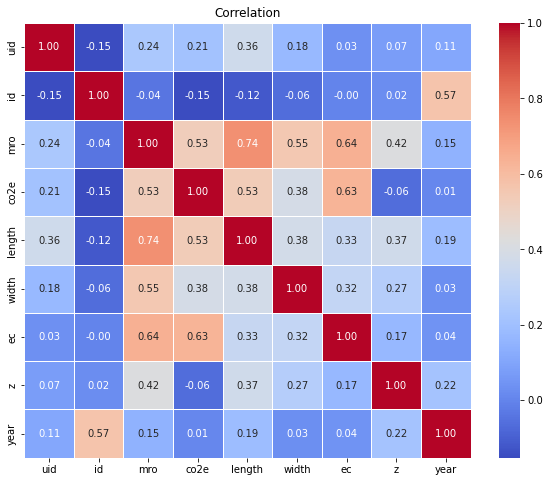

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
corr = co2_vehicles_df.corr()

plt.rcParams['figure.figsize']=(10,8)
sns.heatmap(corr, cmap='coolwarm', linewidth=0.5, fmt='0.2f', annot=True)

plt.title('Correlation')

Nous utiliserons le __Pairplot__ pour vérifier 

Out[31]: <seaborn.axisgrid.PairGrid at 0x7ffb146b9b50>

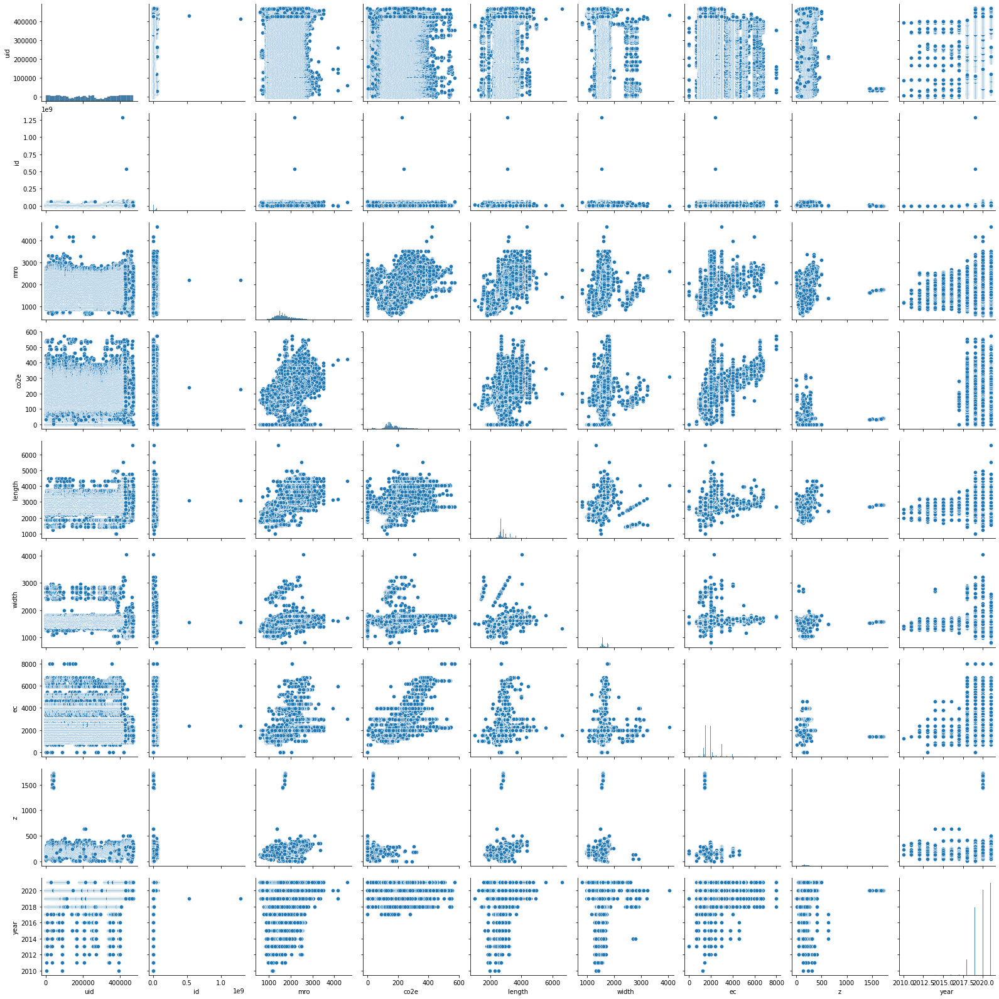

In [0]:
sns.pairplot(co2_vehicles_df)


❗  On remarque que:
- 'year', 'id' et 'uid' n'ont eu aucun impact sur cette rubrique.
- 'width'et 'Lenght' ont une forte corrélation positive.
-  'co2' et 'ec' ont une forte corrélation positive.
-  'mro' et 'ec' ont une forte corrélation positive.


##  📍 <span style="color:blue">**Données de France**</span>

Pour une meilleure compréhension des caractéristiques des véhicules en __France__ et des tendances qui leur sont associées, ce code filtre le DataFrame __"co2_vehicles_df"__ pour ne conserver que les lignes où la valeur dans la colonne __"country"__ est égale à __"FR"__.

In [0]:
#co2 vehicles en france
France_df = co2_vehicles_df[co2_vehicles_df['country'] == 'FR']
France_df.display()

uid,id,country,vfn,tan,make,cn,category,mro,co2e,length,width,ft,ec,z,year
205611,192162,FR,,e2*KS07/46*0007*01,MIA,MIA,M1,925.0,null,2235.0,1384.0,Electric,null,125.0,2013
205612,192163,FR,,e2*KS07/46*0007*02,MIA,MIA,M1,839.0,null,1915.0,1384.0,Electric,null,125.0,2013
205613,207699,FR,,e2*KS07/46*0007*02,MIA,MIA,M1,890.0,null,1915.0,1384.0,Electric,null,125.0,2014
205614,173112,FR,,e2*NKS*0301*00,LUMENEO,NEOMA,M1,945.0,null,1755.0,1479.0,Electric,null,143.0,2013
205677,490574,FR,,e9*2007/46*6160*03,KIA,SOUL,M1,1565.0,null,2570.0,1576.0,Electric,null,147.0,2016
205634,2541979,FR,,e4*2007/46*0667*11,TESLA,MODEL S,M1,2223.0,null,2960.0,1662.0,Electric,null,189.0,2017
205672,206832,FR,,e9*2007/46*6160*00,KIA,SOUL,M1,1565.0,null,2570.0,1576.0,Electric,null,143.0,2014
205278,2628336,FR,,E1*2001/116*0307*45,VOLKSWAGEN,PASSAT,M1,1722.0,null,2786.0,1578.0,Petrol/electric,1395.0,128.0,2018
205279,2628374,FR,,E1*2001/116*0307*47,VOLKSWAGEN,PASSAT,M1,1735.0,null,2786.0,1578.0,Petrol/electric,1395.0,127.0,2018
205280,2628632,FR,,E1*2001/116*0307*49,VOLKSWAGEN,PASSAT,M1,1735.0,null,2786.0,1578.0,Petrol/electric,1395.0,139.0,2018


In [0]:
# Aperçu des informations concernant le DataFrame "electric_vehicles_df" du nombre de colonnes/noms de colonnes/numéro des lignes de valeurs non nulles/types de données
France_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38572 entries, 13 to 237932
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   uid       38572 non-null  int64  
 1   id        38572 non-null  int64  
 2   country   38572 non-null  object 
 3   vfn       38572 non-null  object 
 4   tan       38572 non-null  object 
 5   make      38572 non-null  object 
 6   cn        38572 non-null  object 
 7   category  38572 non-null  object 
 8   mro       38465 non-null  float64
 9   co2e      37789 non-null  float64
 10  length    38373 non-null  float64
 11  width     38562 non-null  float64
 12  ft        38572 non-null  object 
 13  ec        37040 non-null  float64
 14  z         3377 non-null   float64
 15  year      38572 non-null  int64  
dtypes: float64(6), int64(3), object(7)
memory usage: 5.0+ MB


In [0]:
# Vérifier les variables uniques dans France_df pour chaque colonne
missing_value_france = France_df.isnull().sum()
print(missing_value_france)

uid             0
id              0
country         0
vfn             0
tan             0
make            0
cn              0
category        0
mro           107
co2e          783
length        199
width          10
ft              0
ec           1532
z           35195
year            0
dtype: int64


In [0]:
# Correlation entre les features et les étiquêtes 
France_df.corr()

,uid,id,mro,co2e,length,width,ec,z,year
uid,1.000000,-0.231881,0.393607,0.353234,0.618392,0.254284,0.080382,0.310553,0.176432
id,-0.231881,1.000000,-0.063479,-0.191620,-0.125169,-0.080594,-0.042652,0.058594,0.632970
mro,0.393607,-0.063479,1.000000,0.461538,0.737420,0.568216,0.651224,0.502201,0.108191
co2e,0.353234,-0.191620,0.461538,1.000000,0.497999,0.372095,0.620527,-0.033940,-0.034389
length,0.618392,-0.125169,0.737420,0.497999,1.000000,0.391371,0.341484,0.461387,0.166819
width,0.254284,-0.080594,0.568216,0.372095,0.391371,1.000000,0.332407,0.331214,0.025908
ec,0.080382,-0.042652,0.651224,0.620527,0.341484,0.332407,1.000000,0.384046,-0.004313
z,0.310553,0.058594,0.502201,-0.033940,0.461387,0.331214,0.384046,1.000000,0.278446
year,0.176432,0.632970,0.108191,-0.034389,0.166819,0.025908,-0.004313,0.278446,1.000000


In [0]:
# Création de dataFrame de véhicules électriques en France
electric_vehicles_df = France_df[France_df['ft'].str.contains('electric', case=False, na=False)] 

electric_vehicles_df.display()

uid,id,country,vfn,tan,make,cn,category,mro,co2e,length,width,ft,ec,z,year
205611,192162,FR,,e2*KS07/46*0007*01,MIA,MIA,M1,925.0,null,2235.0,1384.0,Electric,null,125.0,2013
205612,192163,FR,,e2*KS07/46*0007*02,MIA,MIA,M1,839.0,null,1915.0,1384.0,Electric,null,125.0,2013
205613,207699,FR,,e2*KS07/46*0007*02,MIA,MIA,M1,890.0,null,1915.0,1384.0,Electric,null,125.0,2014
205614,173112,FR,,e2*NKS*0301*00,LUMENEO,NEOMA,M1,945.0,null,1755.0,1479.0,Electric,null,143.0,2013
205677,490574,FR,,e9*2007/46*6160*03,KIA,SOUL,M1,1565.0,null,2570.0,1576.0,Electric,null,147.0,2016
205634,2541979,FR,,e4*2007/46*0667*11,TESLA,MODEL S,M1,2223.0,null,2960.0,1662.0,Electric,null,189.0,2017
205672,206832,FR,,e9*2007/46*6160*00,KIA,SOUL,M1,1565.0,null,2570.0,1576.0,Electric,null,143.0,2014
205278,2628336,FR,,E1*2001/116*0307*45,VOLKSWAGEN,PASSAT,M1,1722.0,null,2786.0,1578.0,Petrol/electric,1395.0,128.0,2018
205279,2628374,FR,,E1*2001/116*0307*47,VOLKSWAGEN,PASSAT,M1,1735.0,null,2786.0,1578.0,Petrol/electric,1395.0,127.0,2018
205280,2628632,FR,,E1*2001/116*0307*49,VOLKSWAGEN,PASSAT,M1,1735.0,null,2786.0,1578.0,Petrol/electric,1395.0,139.0,2018


In [0]:
# Aperçu des informations concernant le DataFrame "electric_vehicles_df" (nombre de colonnes/noms de colonnes/numéro des lignes de valeurs non nulles/types de données)
electric_vehicles_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3376 entries, 13 to 23861
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   uid       3376 non-null   int64  
 1   id        3376 non-null   int64  
 2   country   3376 non-null   object 
 3   vfn       3376 non-null   object 
 4   tan       3376 non-null   object 
 5   make      3376 non-null   object 
 6   cn        3376 non-null   object 
 7   category  3376 non-null   object 
 8   mro       3369 non-null   float64
 9   co2e      2593 non-null   float64
 10  length    3364 non-null   float64
 11  width     3376 non-null   float64
 12  ft        3376 non-null   object 
 13  ec        1844 non-null   float64
 14  z         3376 non-null   float64
 15  year      3376 non-null   int64  
dtypes: float64(6), int64(3), object(7)
memory usage: 448.4+ KB


comme indiqué qu'il y'a des valeurs manquantes pour __'VFN'__,__'tan'__, __'mro'__, __'co2'__, __'ep'__, __'ec'_qu'on peut le quantifier par le code ci-dessous 👇 .

In [0]:
missing_value_electric = electric_vehicles_df.isnull().sum()
print(missing_value_electric)

uid            0
id             0
country        0
vfn            0
tan            0
make           0
cn             0
category       0
mro            7
co2e         783
length        12
width          0
ft             0
ec          1532
z              0
year           0
dtype: int64


❗  D'aprés ce résultat, on doit supprimer les lignes du DataFrame __"co2_vehicles_df"__ où la colonne __"Ft"__ a la valeur __"Electric"__ et la colonne __"Ep"__ est __nulle__ .

## ÉTAPE 3 : Visualisation des données

* Histogramme 
* Box Plot
* cat Plot
* Displot

##  📊 <span style="color:blue">**Visualisations de la distribution  des features**</span>


## 📊 <span style="color:red">**Histogramme**</span>


##   <span style="color:green">**#Make**</span>


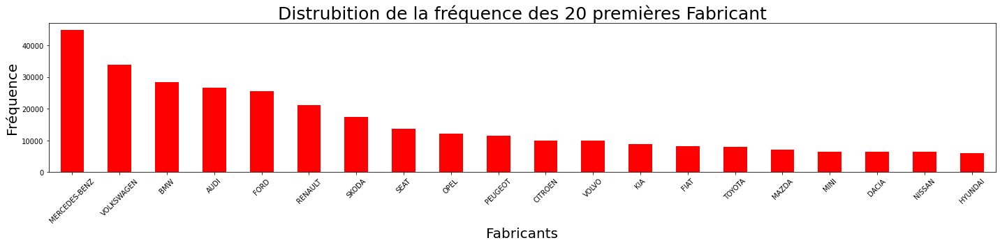

In [0]:
# Trier les fréquences de fabricants par ordre décroissant
make_counts = co2_vehicles_df['make'].value_counts().sort_values(ascending=False)

# Extraire les 20 marques les plus courantes et leurs fréquences
top_20_makes = make_counts[:20]

# Tracer le graphique pour les 20 premières marques
plt.figure(figsize=(20, 5))
top_20_makes.plot(kind='bar', color='red')
plt.title('Distrubition de la fréquence des 20 premières Fabricant En Europe', fontsize=25)
plt.xlabel('Fabricants', fontsize=20)
plt.ylabel('Fréquence', fontsize=20)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



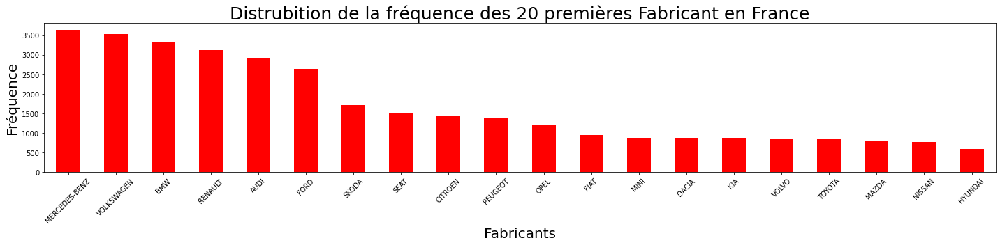

In [0]:
# Trier les fréquences de fabricants par ordre décroissant
make_counts = France_df['make'].value_counts().sort_values(ascending=False)

# Extraire les 20 marques les plus courantes et leurs fréquences
top_20_makes = make_counts[:20]

# Tracer le graphique pour les 20 premières marques
plt.figure(figsize=(20, 5))
top_20_makes.plot(kind='bar', color='red')
plt.title('Distrubition de la fréquence des 20 premières Fabricant en France', fontsize=25)
plt.xlabel('Fabricants', fontsize=20)
plt.ylabel('Fréquence', fontsize=20)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

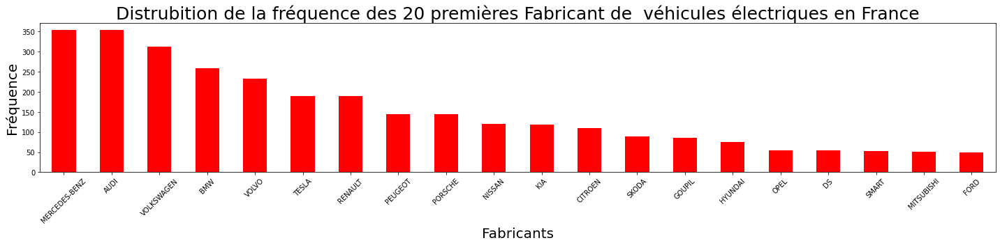

In [0]:
# Trier les fréquences de fabricants de véhicules électriques par ordre décroissant en France
make_counts = electric_vehicles_df['make'].value_counts().sort_values(ascending=False)

# Extraire les 20 marques les plus courantes et leurs fréquences
top_20_makes = make_counts[:20]

# Tracer le graphique pour les 20 premières marques
plt.figure(figsize=(20, 5))
top_20_makes.plot(kind='bar', color='red')
plt.title('Distrubition de la fréquence des 20 premières Fabricant de  véhicules électriques en France', fontsize=25)
plt.xlabel('Fabricants', fontsize=20)
plt.ylabel('Fréquence', fontsize=20)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##   <span style="color:green">**#Fuel Type**</span>


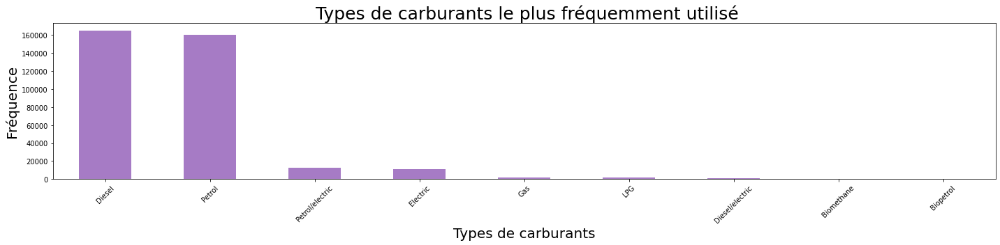

In [0]:
plt.figure(figsize=(20,5))

co2_vehicles_df.groupby('ft')['ft'].count().sort_values(ascending=False).plot(kind='bar')

plt.title(' Types de carburants le plus fréquemment utilisé', fontsize=25)
plt.xlabel('Types de carburants', fontsize=20)
plt.ylabel ('Fréquence', fontsize=20)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

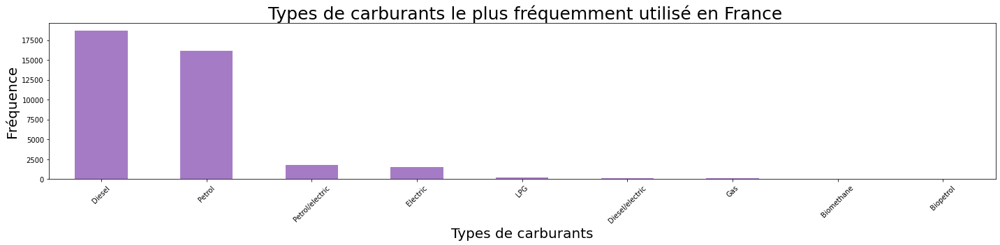

In [0]:
# Type de carburant en France

plt.figure(figsize=(20,5))

France_df.groupby('ft')['ft'].count().sort_values(ascending=False).plot(kind='bar')

plt.title(' Types de carburants le plus fréquemment utilisé en France', fontsize=25)
plt.xlabel('Types de carburants', fontsize=20)
plt.ylabel ('Fréquence', fontsize=20)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##   <span style="color:green">**#Consommation électrique (Wh/km)**</span>


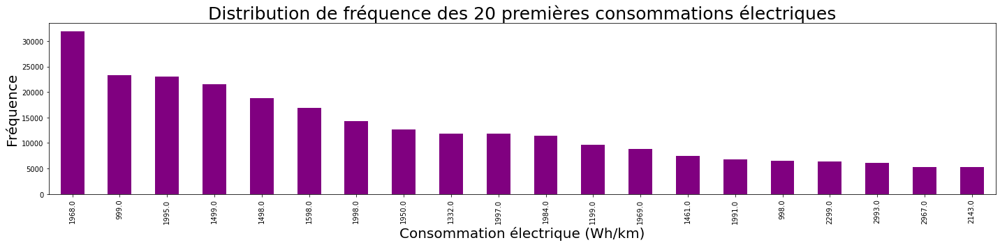

In [0]:
# les 20 consommation électrique les plus fréquents

# Trier les fréquences des consommation électrique par ordre décroissant et sélectionner les 20 premières
top_20_electricity_consumption = co2_vehicles_df['ec'].value_counts().sort_values(ascending=False).head(20)

# Tracer le graphique pour les 20 premiers consommation électrique
plt.figure(figsize=(20, 5))
top_20_electricity_consumption.plot(kind='bar', color='purple')
plt.title('Distribution de fréquence des 20 premières consommations électriques', fontsize=25)
plt.xlabel('Consommation électrique (Wh/km)', fontsize=20)
plt.ylabel('Fréquence', fontsize=20)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [0]:
plt.figure(figsize=(20,5))

co2_vehicles_df.groupby('z')['z'].count().sort_values(ascending=True).plot(kind='bar', color='purple')

plt.title('wltp (Wh/km)', fontsize=25)
plt.xlabel('wltp (km/h)', fontsize=20)
plt.ylabel('Fréquence', fontsize=20)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

/databricks/python/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



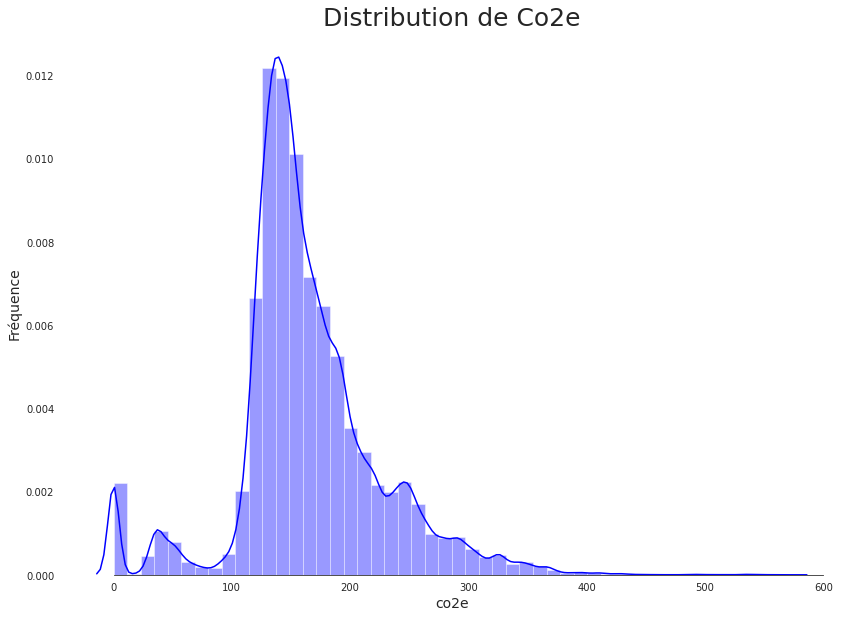

In [0]:
sns.set_style("white")
sns.set_color_codes(palette="deep")
f, ax = plt.subplots(figsize=(14, 10))

sns.distplot(co2_vehicles_df['co2e'], color="blue")
ax.set_ylabel("Fréquence", fontsize=14)  # Taille de police pour l'axe Y
ax.set_xlabel("co2e", fontsize=14)        # Taille de police pour l'axe X
ax.set_title("Distribution de Co2e", fontsize=25)
sns.despine(trim=True, left=True)
plt.show()


![](https://i.pinimg.com/originals/c1/01/b0/c101b0da6ea1a0dab31f80d9963b0368.png)

. L'asymétrie (ou skewness en anglais) mesure le degré de distorsion par rapport à la courbe en cloche symétrique ou à la distribution normale.

. Une distribution symétrique a une asymétrie de 0.

. L'asymétrie peut être positive ou négative.

. Asymétrie positive lorsque la moyenne et la médiane sont supérieures au mode.

. Asymétrie négative lorsque la moyenne et la médiane sont inférieures au mode.


![](https://i.pinimg.com/564x/e1/f0/b2/e1f0b20eb0773915fc6e9b91909adfa3.jpg)

. L'aplatissement (Le kurtosis) est la mesure des valeurs aberrantes présentes dans la distribution.

. Il existe trois types d'aplatissement : mesokurtique, leptokurtique et platykurtique.

. Une distribution mesokurtique indique un aplatissement en excès de zéro. Cela signifie que les données suivent une distribution normale.

. Une distribution leptokurtique montre un aplatissement en excès positif, ce qui signifie qu'elle a des queues lourdes, c'est-à-dire qu'il existe des valeurs aberrantes importantes.

. Une distribution platykurtique montre un aplatissement en excès négatif.

In [0]:
print("Skewness : %f" % co2_vehicles_df['co2e'].skew() )
print("Kurtosis : %f" % co2_vehicles_df['co2e'].kurt())

Skewness : 0.428604
Kurtosis : 2.347985


* L'asymétrie est légèrement positive (0.425296) pour la variable "co2e", ce qui indique une concentration légèrement plus élevée de données vers les valeurs inférieures de "co2e" avec quelques valeurs plus élevées étalées sur la droite.<br>
Cela s'expliquer par le fait vehicules électrique ont un CO2e nul (pas d'émissions directes de GES) et que les véhicules hybrides ont un CO2e très faible (leur motorisation étant en grande partie électrique).
* L'applatissement est de 2.341100 pour la variable "co2e". Cela indique que la distribution de "co2e" a une applatissement positive, Cela suggère que les valeurs de "co2e" sont un peu plus concentrées autour de la moyenne avec des queues plus épaisses par rapport à une distribution normale, c'est-à-dire qu'il existe des valeurs aberrantes importantes.

* **Transformation logarithmique de la variable dépendante (co2e)**

/databricks/python/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



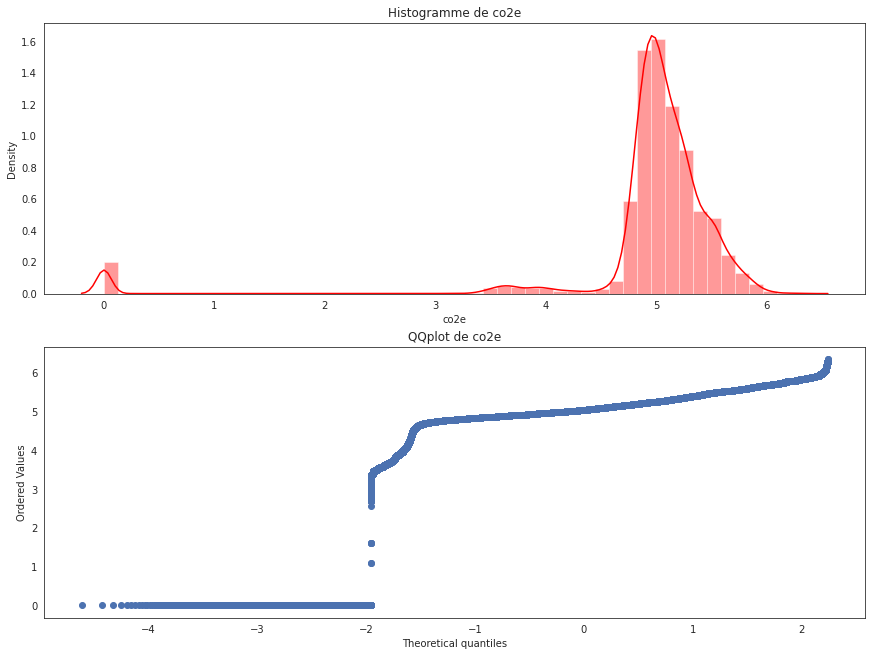

In [0]:
# Effectuez la transformation logarithmique de "co2e" en utilisant log1p
co2_vehicles_df['co2e'] = np.log1p(co2_vehicles_df['co2e'])
sns.set_color_codes(palette="deep")

# Visualisez la variable "co2e" après la normalisation
fig, (ax1, ax2) = plt.subplots(2, 1, constrained_layout=True, figsize=(12, 9))

# Histogramme
sns.distplot(co2_vehicles_df['co2e'], ax=ax1, color="red")
ax1.set_title("Histogramme de co2e")

# QQplot
stats.probplot(co2_vehicles_df['co2e'], plot=ax2)
ax2.set_title("QQplot de co2e")

plt.show()

##  📊 <span style="color:blue">**Visualisations des variations des emissions de CO2 avec differents features**</span>


##   <span style="color:green">**#Make**</span>


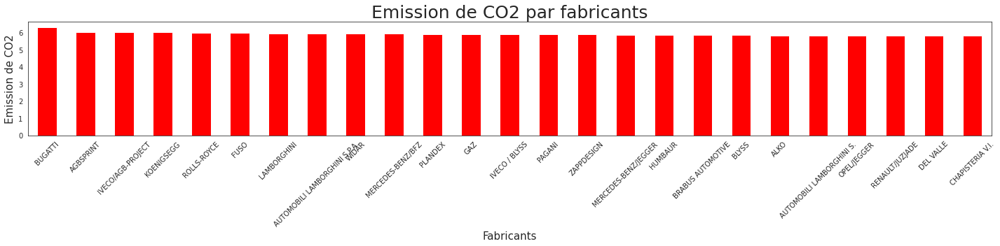

In [0]:
# Visualisation relative à l’émission de CO2
plt.figure(figsize=(20,5))

co2_vehicles_df.groupby('make')['co2e'].mean().sort_values(ascending=False)[:25].plot(kind='bar', color='red')

plt.title('Emission de CO2 par fabricants', fontsize=25)
plt.xlabel('Fabricants', fontsize=15)
plt.ylabel('Emission de CO2', fontsize=15)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


##   <span style="color:green">**#CN**</span>


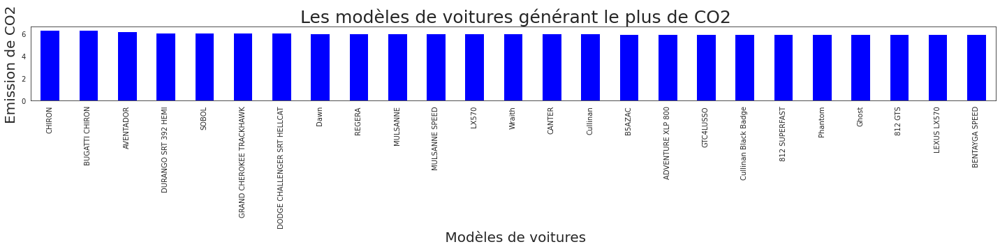

In [0]:
plt.figure(figsize=(20,5))

co2_vehicles_df.groupby('cn')['co2e'].mean().sort_values(ascending=False)[:25].plot(kind='bar', color='blue')

plt.title(' Les modèles de voitures générant le plus de CO2', fontsize=25)
plt.xlabel(' Modèles de voitures', fontsize=20)
plt.ylabel('Emission de CO2', fontsize=20)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

##   <span style="color:green">**#Fuel type**</span>


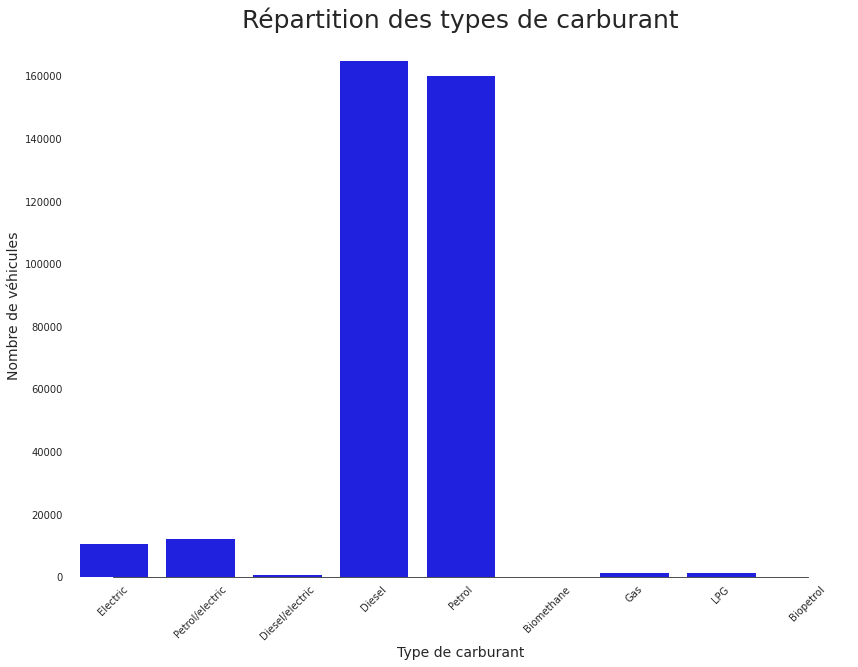

In [0]:
sns.set_style("white")
sns.set_color_codes(palette="deep")
f, ax = plt.subplots(figsize=(14, 10))

# Utilisez seaborn pour créer un graphique à barres des types de carburants
sns.countplot(data=co2_vehicles_df, x='ft', color="blue")
ax.set_ylabel("Nombre de véhicules", fontsize=14)
ax.set_xlabel("Type de carburant", fontsize=14)
ax.set_title("Répartition des types de carburant", fontsize=25)
sns.despine(trim=True, left=True)
plt.xticks(rotation=45)  # Fait pivoter les étiquettes de l'axe X pour une meilleure lisibilité
plt.show()



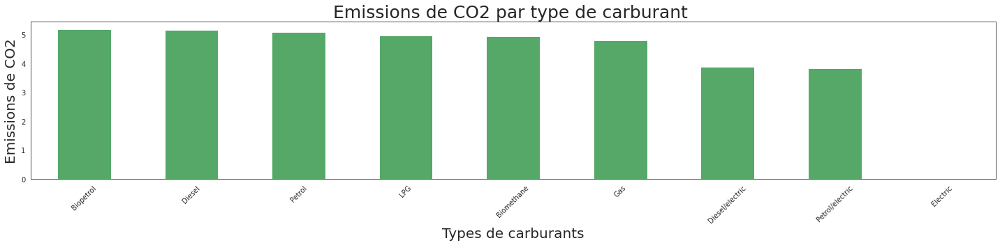

In [0]:
# Type de carburant par rapport aux émissions de CO2
plt.figure(figsize=(20,5))

co2_vehicles_df.groupby('ft')['co2e'].mean().sort_values(ascending=False).plot(kind='bar',color='g')

plt.title('Emissions de CO2 par type de carburant ', fontsize=25)
plt.xlabel('Types de carburants', fontsize=20)
plt.ylabel('Emissions de CO2', fontsize=20)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 🀄 <span style="color:red">**Box plot**</span>

/databricks/python/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/databricks/python/lib/python3.9/site-packages/seaborn/_core.py:1326: UserWarning:

Vertical orientation ignored with only `x` specified.



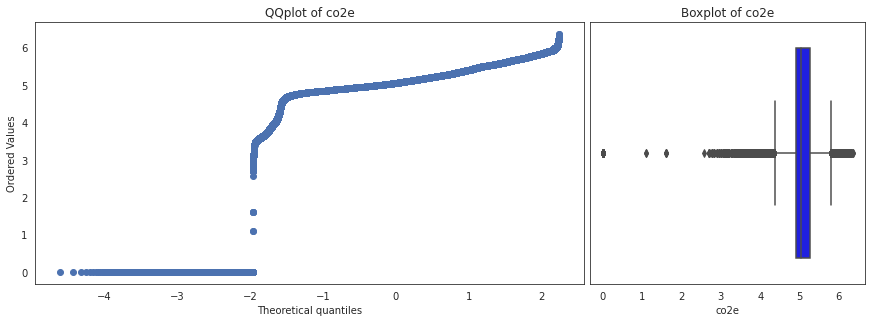

In [0]:
fig = plt.figure(constrained_layout=True, figsize=(12,8))
grid = gridspec.GridSpec(ncols=3, nrows=4, figure=fig)
sns.set_color_codes(palette="deep")

# QQplot

ax2 = fig.add_subplot(grid[2:,:2])
stats.probplot(co2_vehicles_df['co2e'],plot=ax2)
ax2.set_title("QQplot of co2e")

 # Boxplot
    
ax3 = fig.add_subplot(grid[2:,2])
sns.boxplot(co2_vehicles_df['co2e'],ax=ax3,orient="v",color="Blue")
ax3.set_title("Boxplot of co2e")
plt.show()

##   <span style="color:green">**#Fuel type**</span>


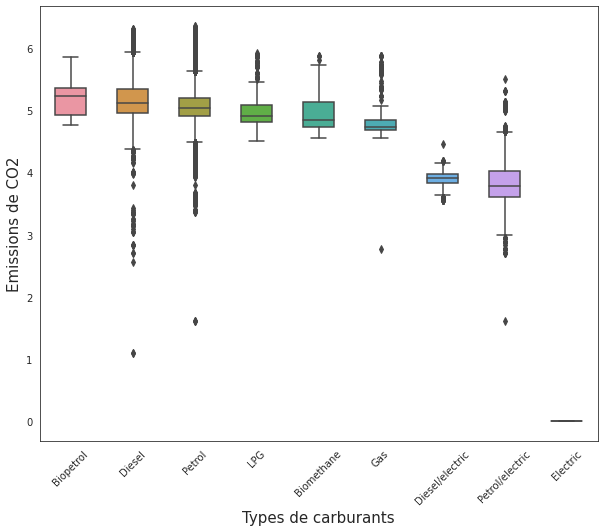

In [0]:
#Box plot des émissions de CO2 par type de carburant 

fuel_type = co2_vehicles_df.groupby('ft')['co2e'].median().sort_values(ascending=False).index
plt.figure(figsize=(10, 8))
sns.boxplot(x='ft', y='co2e', data=co2_vehicles_df, order=fuel_type, width=0.5)
plt.xticks(rotation=45, horizontalalignment='center')

# Rename the x and y-axis labels
plt.xlabel('Types de carburants', fontsize=15)
plt.ylabel('Emissions de CO2', fontsize=15)

plt.show()


##   <span style="color:green">**#Make**</span>


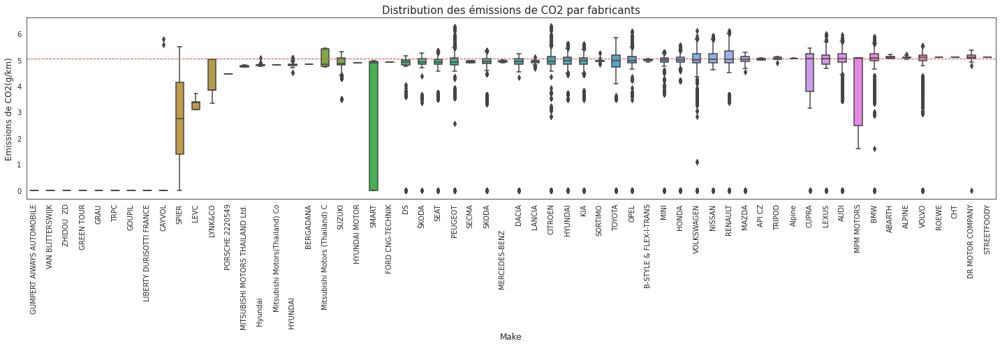

In [0]:
plt.figure(figsize=(20,7))
order = co2_vehicles_df.groupby("make")["co2e"].median().sort_values(ascending=True)[40:100].index
sns.boxplot(x="make", y="co2e", data=co2_vehicles_df, order=order, width=0.5)
plt.title("Distribution des émissions de CO2 par fabricants", fontsize=15)
plt.xticks(rotation=90, horizontalalignment='center')
plt.xlabel("Make", fontsize=12)
plt.ylabel("Emissions de CO2(g/km)", fontsize=12)
plt.axhline(co2_vehicles_df["co2e"].median(),color='r',linestyle='dashed',linewidth=1)
plt.tight_layout()
plt.show()


## 🔴 <span style="color:red">**Catplot**</span>

##   <span style="color:green">**#Consommations électriques**</span>


<Figure size 720x576 with 0 Axes>

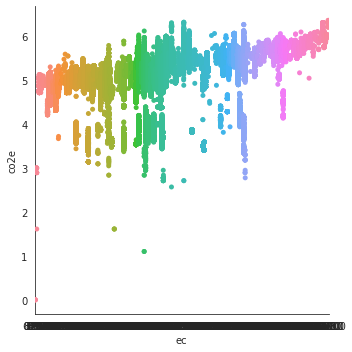

In [0]:
plt.figure(figsize=(10,8))

sns.catplot(x='ec', y='co2e',data = co2_vehicles_df)

plt.show()  

## 📈 <span style="color:red">**Displot**</span>

##   <span style="color:green">**#CO2**</span>


/databricks/python/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Out[63]: <AxesSubplot:xlabel='co2e', ylabel='Density'>

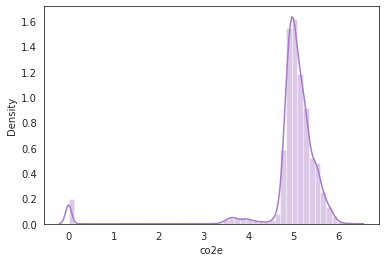

In [0]:
sns.distplot(co2_vehicles_df['co2e'])


##   <span style="color:green">**#Consommations électriques**</span>


/databricks/python/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Out[64]: <AxesSubplot:xlabel='ec', ylabel='Density'>

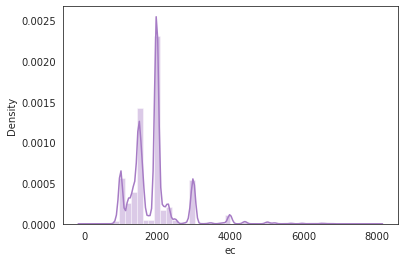

In [0]:
sns.distplot(co2_vehicles_df['ec'])

##   <span style="color:green">**#Length**</span>


/databricks/python/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Out[65]: <AxesSubplot:xlabel='length', ylabel='Density'>

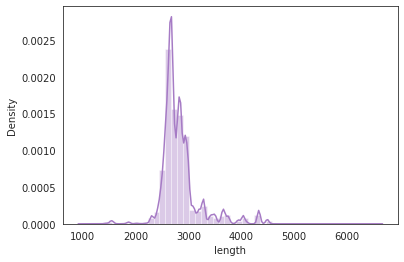

In [0]:
# Engine Size(L)
sns.distplot(co2_vehicles_df['length'])

# 📝 Conclusion de l'EDA 


1. Les données représentent __11 pays__ de l'union européenne.
2. Les marques de voitures et les modéles nécessitent une normalisation d'écriture.  
3. Nettoyage des données si ces conditions sont vérifiées :
- la colonne __"co2=0"__ et la colonne __"ft=! Electric" et "ft!= Hydrogen"__.
- la colonne __"ft"__ contient "Electric" et la colonne __"ep= Null"__ .
- la colonne __"ft= Electric"__ et la colonne __"co2>0"__.
4. Les données présentes dix types de carburant.Nous n’avons qu’une seule donnée sur Biodiesel. Nous ne pouvons donc rien prédire en utilisant une seule donnée. C’est pourquoi nous avons décidé de supprimer cet enregistrement.
5. Nous n'avons pas identifié de corrélation qui mettrait à jour une tendance particulière.


##  📊 <span style="color:blue">**Visualisations des variations des emissions de CO2 avec differents features**</span>


##   <span style="color:green">**#Make**</span>


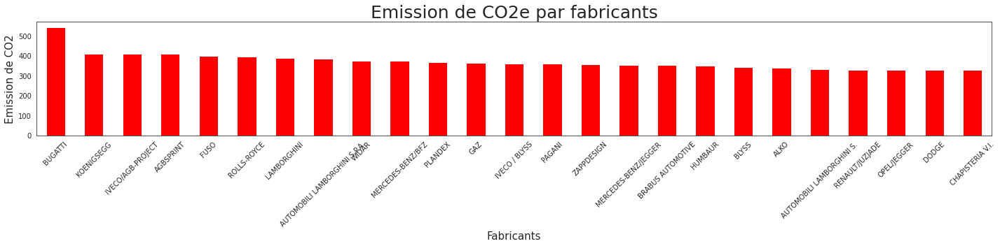

In [0]:
# Visualisation relative à l’émission de CO2
plt.figure(figsize=(20,5))

co2_vehicles_clean_df.groupby('make')['co2e'].mean().sort_values(ascending=False)[:25].plot(kind='bar', color='red')

plt.title('Emission de CO2e par fabricants', fontsize=25)
plt.xlabel('Fabricants', fontsize=15)
plt.ylabel('Emission de CO2', fontsize=15)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


##   <span style="color:green">**#CN**</span>


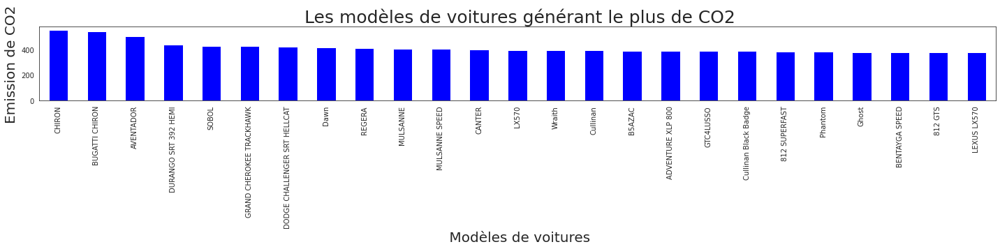

In [0]:
plt.figure(figsize=(20,5))

co2_vehicles_clean_df.groupby('cn')['co2e'].mean().sort_values(ascending=False)[:25].plot(kind='bar', color='blue')

plt.title(' Les modèles de voitures générant le plus de CO2', fontsize=25)
plt.xlabel(' Modèles de voitures', fontsize=20)
plt.ylabel('Emission de CO2', fontsize=20)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

##   <span style="color:green">**#Fuel type**</span>


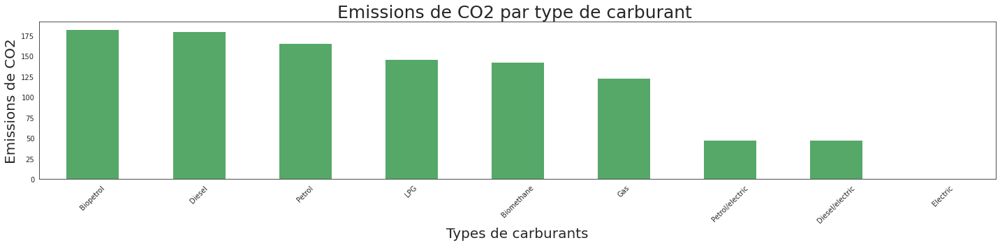

In [0]:
# Type de carburant par rapport aux émissions de CO2
plt.figure(figsize=(20,5))

co2_vehicles_clean_df.groupby('ft')['co2e'].mean().sort_values(ascending=False).plot(kind='bar',color='g')

plt.title('Emissions de CO2 par type de carburant ', fontsize=25)
plt.xlabel('Types de carburants', fontsize=20)
plt.ylabel('Emissions de CO2', fontsize=20)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 🀄 <span style="color:red">**Box plot**</span>

##   <span style="color:green">**#Fuel type**</span>


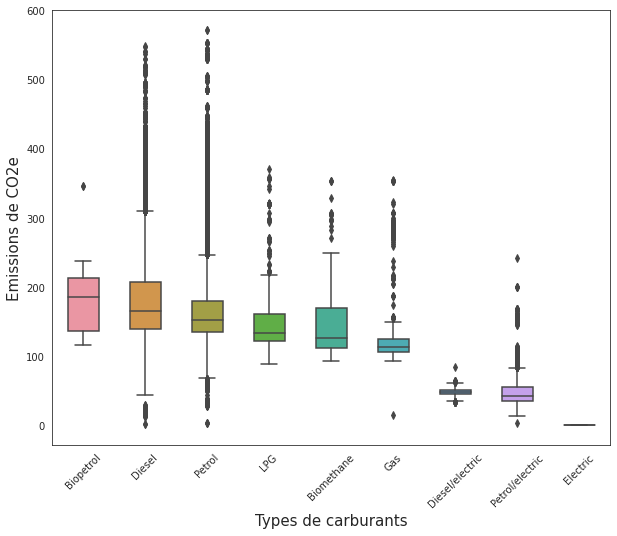

In [0]:
#Box plot des émissions de CO2 par type de carburant 

fuel_type = co2_vehicles_clean_df.groupby('ft')['co2e'].median().sort_values(ascending=False).index
plt.figure(figsize=(10, 8))
sns.boxplot(x='ft', y='co2e', data=co2_vehicles_clean_df, order=fuel_type, width=0.5)
plt.xticks(rotation=45, horizontalalignment='center')

# Rename the x and y-axis labels
plt.xlabel('Types de carburants', fontsize=15)
plt.ylabel('Emissions de CO2e', fontsize=15)

plt.show()


##   <span style="color:green">**#Make**</span>


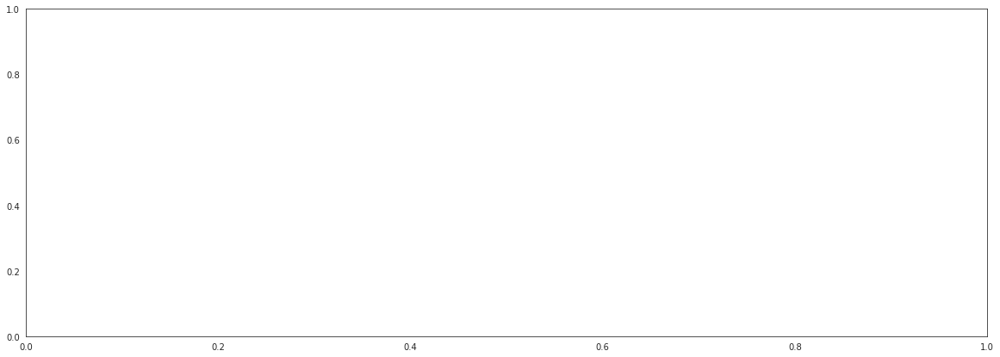

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-3648895048205189>:3
      1 plt.figure(figsize=(20,7))
      2 make = co2_vehicles_clean_df.groupby("make")["co2e"].median().sort_values(ascending=True)[40:100].index
----> 3 sns.boxplot(x="make", y="co2e", data=co2_vehicles_clean_df, make=make, width=0.5)
      4 plt.title("Distribution des émissions de CO2e par fabricants", fontsize=15)
      5 plt.xticks(rotation=90, horizontalalignment='center')

File /databricks/python/lib/python3.9/site-packages/seaborn/_decorators.py:46, in _deprecate_positional_args.<locals>.inner_f(*args, **kwargs)
     36     warnings.warn(
     37         "Pass the following variable{} as {}keyword arg{}: {}. "
     38         "From version 0.12, the only valid positional argument "
   (...)
     43         FutureWarning
     44     )
     45 kwargs.update({k: arg for k, arg in zip(sig.parameter

In [0]:
plt.figure(figsize=(20,7))
make = co2_vehicles_clean_df.groupby("make")["co2e"].median().sort_values(ascending=True)[40:100].index
sns.boxplot(x="make", y="co2e", data=co2_vehicles_clean_df, make=make, width=0.5)
plt.title("Distribution des émissions de CO2e par fabricants", fontsize=15)
plt.xticks(rotation=90, horizontalalignment='center')
plt.xlabel("Make", fontsize=12)
plt.ylabel("Emissions de CO2e(g/km)", fontsize=12)
plt.axhline(co2_vehicles_clean_df["co2e"].median(),color='r',linestyle='dashed',linewidth=1)
plt.tight_layout()
plt.show()